# Traffic lane marking detection
In this assignment, you will use image processing techniques and the Hough Transform to identify traffic lane markings in a series of test images. \
There are 5 sets of images in total. Start with set 1, and then review the other sets (some are more difficult than others)


## Submission Details
Assignment deadline: Midnight, Sunday 10 November \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 20% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment3.ipynb

# Submission details
### Name: Patrick Noonan
### ID: 20355426
### Class code: MECE

In [3]:
# install required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import random
%matplotlib inline


## Load test images


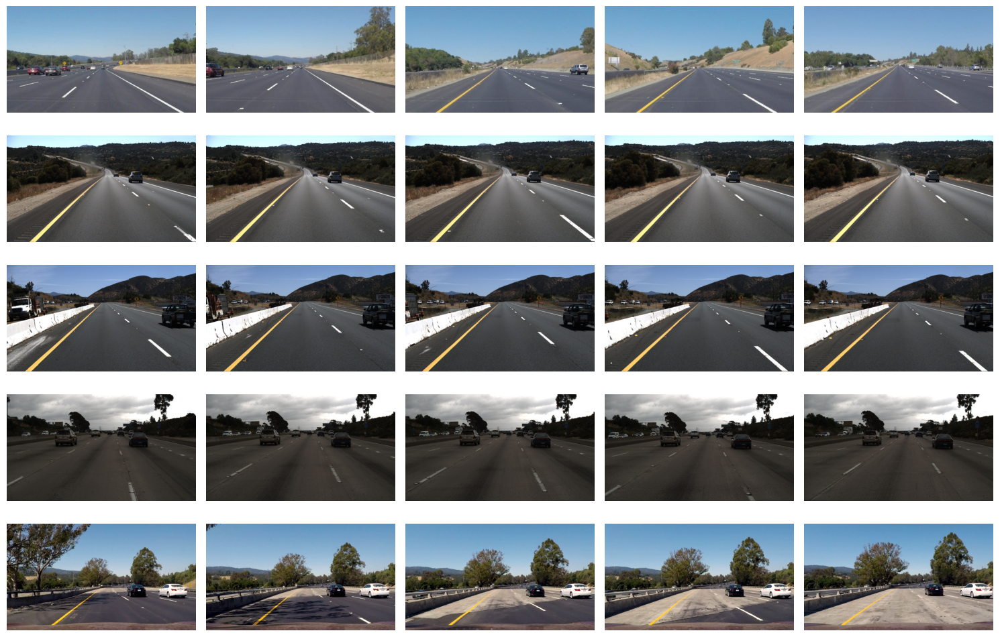

In [4]:
import os
import cv2
import matplotlib.pyplot as plt

# Set up the file path to read in value sinto the dictionary
base_input_path = 'images/'
set_names = ['set_1', 'set_2', 'set_3', 'set_4', 'set_5'] # Each set stored in different folder
images_by_set = {}

# Loop through each folder in the folder and read in each of the images
for set_name in set_names:
    input_path = os.path.join(base_input_path, set_name)
    filenames = [os.path.join(input_path, filename) for filename in os.listdir(input_path)]
    # Read each image in the current set and store it in a list
    images_by_set[set_name] = [cv2.imread(filename) for filename in filenames]

num_sets = len(set_names) # Number of sets
num_images_per_set = max(len(images) for images in images_by_set.values()) #max number of images in a set

fig, axes = plt.subplots(num_sets, num_images_per_set, figsize=(15, 10)) #create a subplot to store all of the images 
#plot the images in the subplot
for row, set_name in enumerate(set_names):
    images = images_by_set[set_name]
    for col in range(num_images_per_set):
        ax = axes[row, col] if num_sets > 1 else axes[col]  
        if col < len(images):
            ax.imshow(cv2.cvtColor(images[col], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
            ax.axis('off')
        else:
            ax.axis('off') 

plt.tight_layout()
plt.show()

## Convert the images to greyscale

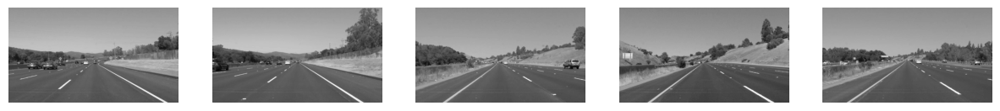

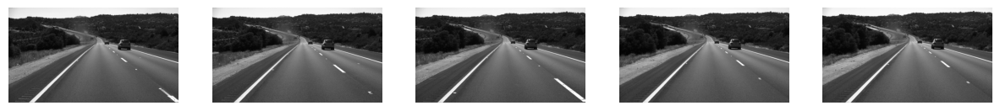

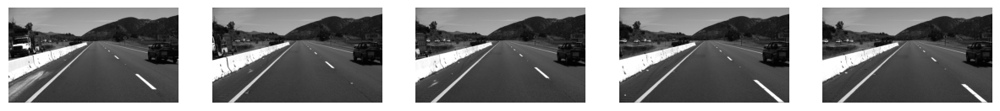

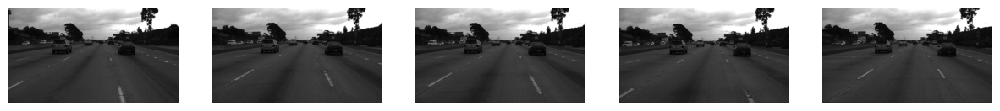

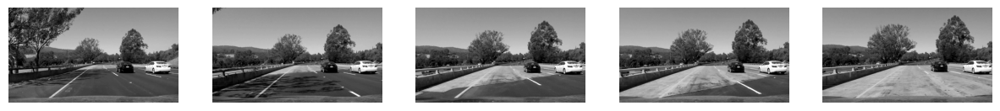

In [5]:
images_by_set_grey = {} ## create new list for the greyscale images

# Convert each image in each set to grayscale
for set_name, images in images_by_set.items():
    grey_images = [cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) for image in images]
    images_by_set_grey[set_name] = grey_images

# Display grayscale images for each set
for set_name, grey_images in images_by_set_grey.items():
    fig, axs = plt.subplots(1, len(grey_images), figsize=(15, 5))
    for i, grey in enumerate(grey_images):
        axs[i].imshow(grey, cmap='gray')
        axs[i].axis('off')
    plt.show()

    

## Apply Gaussian blur
Gaussian blur reduces noise and weak edges. In principle, only sharper, more defined edges (i.e. road markings) will remain\

The image should look something like this:
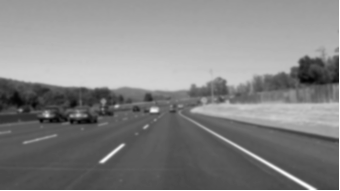

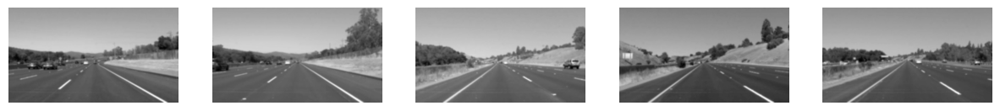

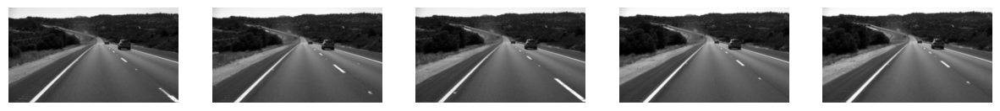

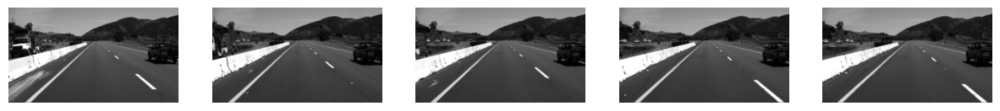

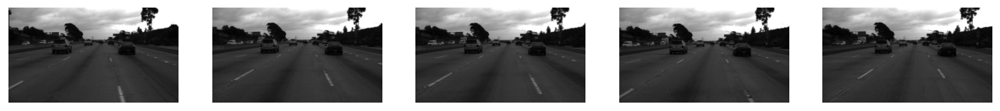

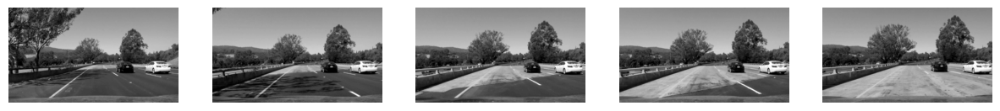

In [ ]:
kernel_size = 5

blur_images_set = {}
## Set 4 needed differntt kernel sizes to get a better result
for set_name, images in images_by_set_grey.items():
    
    if set_name == 'set_4':
        blur_images = [cv2.GaussianBlur(image, (9, 5), 1.5) for image in images]
    elif set_name == 'set_5':
        blur_images = [cv2.GaussianBlur(image, (5, 15), 1.5) for image in images] ##Blur for set 5 done in the code block below not this line
    else:
        blur_images = [cv2.GaussianBlur(image, (15, 15), 0) for image in images]

    blur_images_set[set_name] = blur_images

# Display blurred images for each set
for set_name, grey_images in blur_images_set.items():
    fig, axs = plt.subplots(1, len(grey_images), figsize=(15, 5))
    for i, grey in enumerate(grey_images):
        axs[i].imshow(grey, cmap='gray')
        axs[i].axis('off')
    plt.show()

## Set 5 Applying extra processing in the pipeline
- For set 5 it was a struggle to get it to work effectively using the processing pipeline of the previous sets.
- Main issues for it was the noise of the black road marking on the roads I firstly used the Canny edge detector and also use sobel with only the kernel that discovers vertical edges both of these didn't fix the problem as the nosie needs to be removed from the image before the edge detection takes place.
- I tried putting an extreme blur on the image to take horizontal edge and noise out of the image. This wasn't effective in the slightest. 
- With some thought and research i tried using colourmaps to make the orange and white colour pop out in the image so the edges for the road amrkings would be far more obvious then the noise and then we could try to threshold the nosie out of the image.
- While researching this I saw examples where you can threshold the image using certain RGB valuse or colour values which would only keep these images in the image and fade the rest of the image to darkness removing the noise I was struggling to get rid of and making really obvious edges for the canny edge detector to detect. 
- Once I tried to implement this solution it was far more effective then any of the other methods and knew it was the best solution. 
- Biggest learning I got out of the experience was that you can adjust the the parameters in the processing step but it isn't going to work miracles you have to have an image with similar quality to the canny images of the other sets before even thinking about doing the Hough transform. I spent alot of time messing with paramters in the Hough transform and sobel kernel when the image was too noisy to work with in that stage of the pipeline. 

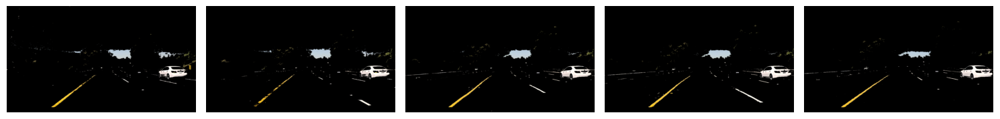

In [7]:
masked_images = []

for image in images_by_set['set_5']:
    # Convert the image to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # White color mask 
    lower_threshold_white = np.uint8([185, 185, 185])
    upper_threshold_white = np.uint8([255, 255, 255])
    
    #Create a mask for white areas any pixels that are in threshold are kept in the image
    white_mask = cv2.inRange(image, lower_threshold_white, upper_threshold_white)

    # Yellow color mask 
    lower_threshold_yellow = np.array([20, 100, 100])
    upper_threshold_yellow = np.array([40, 255, 255])

    # Create a mask for yello areas any pixels that are in threshold are kept in the image
    yellow_mask = cv2.inRange(hsv_image, lower_threshold_yellow, upper_threshold_yellow)

    # Both masks are combined using a bitwise or statement
    mask = cv2.bitwise_or(white_mask, yellow_mask)

    # This mask is then applied to actual image with bitwise and statement i.e it has to be in the mask and the image to be kept
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    blur_image = cv2.GaussianBlur(masked_image, (7, 3), 0)
    masked_images.append(blur_image)
    
blur_images_set['set_5'] = masked_images #These are then placed into the dictionary


# Dispaly these iamges to ensurer the process completed successfully.
fig, axs = plt.subplots(1, len(blur_images_set['set_5']), figsize=(15, 5))
for i, masked_image in enumerate(blur_images_set['set_5']):
    axs[i].imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')    
    
plt.tight_layout()
plt.show()



## Detect edges
The next step is to detect edges in the image. In general, the Canny edge detector works well for this operation\

The result should look something like this:
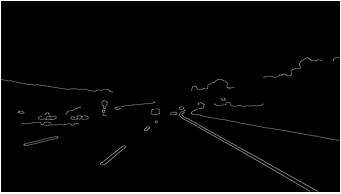

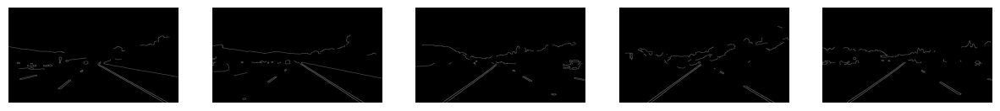

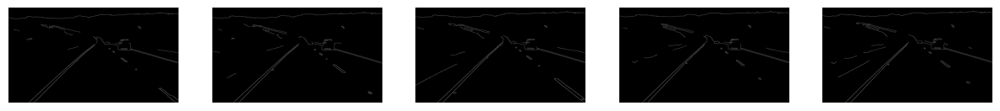

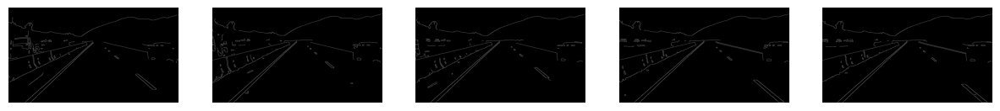

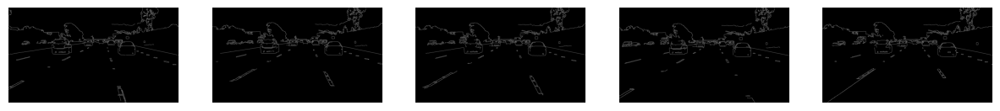

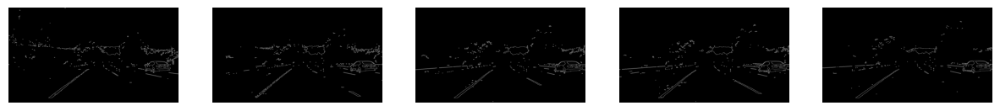

In [8]:
# define edge thresholds. Note: these thresholds may need to be adjusted for different scenarios.
# hint: 20 and 100 work well for the first set (but not necessarily all...)
# apply edge detection to the blur_images list of images
canny_images_set = {}
for set_name, images in blur_images_set.items():
    if set_name == 'set_4':
        canny = [cv2.Canny(image, 30, 85) for image in images]
    elif set_name == 'set_5':
        canny = [cv2.Canny(image, 30, 100) for image in images]
    else:
        canny = [cv2.Canny(image, 20, 110) for image in images]

    canny_images_set[set_name] = canny
    
#display edge images
for set_name, images in canny_images_set.items():
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    for i, canny in enumerate(images):
        axs[i].imshow(canny, cmap='gray')
        axs[i].axis('off')
    plt.show()


## Define region of interest
We only want to look for edges in the road in front of the camera, and we want to ignore edges in the sky, background etc. To do this, we will define a region of interest. All edges outside the region of interest are ignored

The result should look something like this example, where most of the background has been ignored:
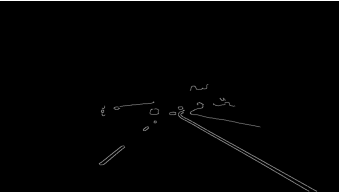


In [9]:
# Note: use this code as is, there is no need to change

# define a region of interest mask
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon defined by "vertices". 
    The rest of the image is set to black.
    """
    #define a blank mask
    mask = np.zeros_like(img)   
    
    #define a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

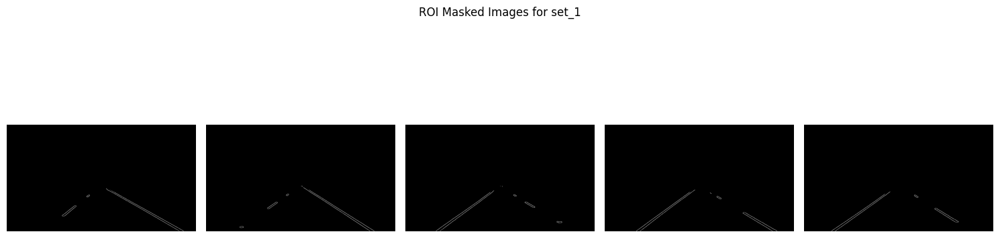

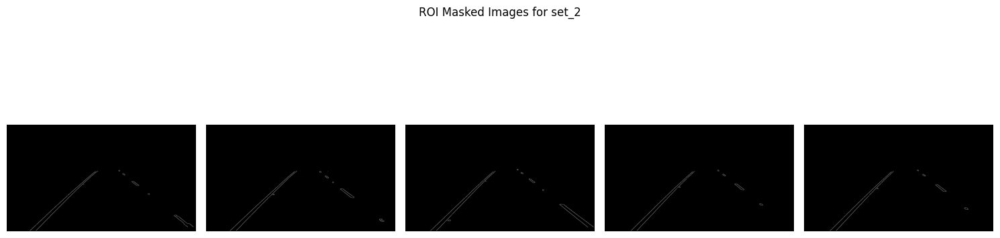

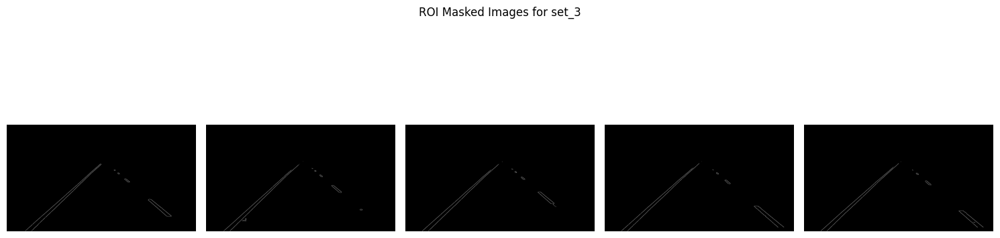

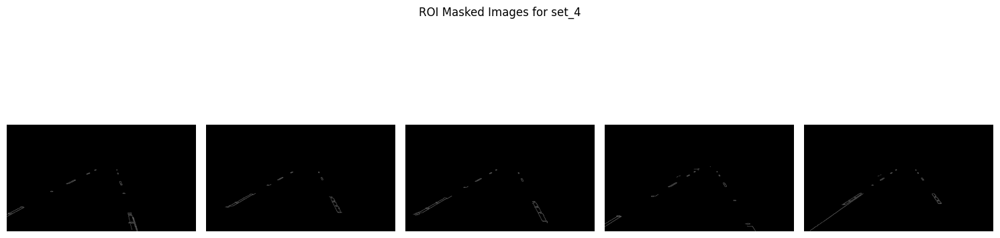

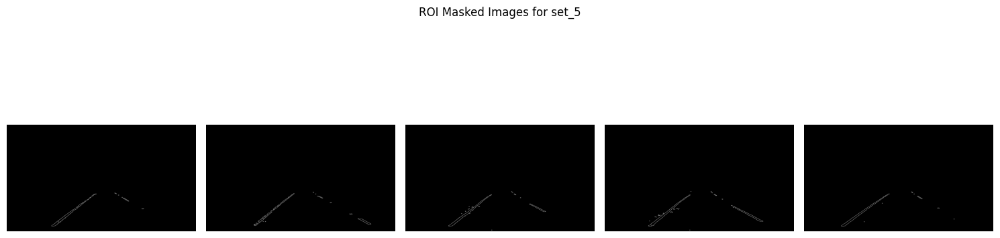

In [10]:
image_shapes = {}

for set_name, images in images_by_set.items():
        image_shapes[set_name] = images[0].shape 

def get_region(set_name, xsize, ysize):
    if set_name == 'set_1':
        return np.array([[(500, 310), (xsize - 480, 310), (xsize, ysize), (0, ysize)]], dtype=np.int32)
    elif set_name in 'set_2':
        return np.array([[(550, 325), (xsize - 500, 280), (xsize, ysize - 30), (0, ysize)]], dtype=np.int32)
    elif set_name == 'set_3':
        return np.array([[(680, 230), (xsize - 650, 230), (xsize, ysize - 30), (20, ysize)]], dtype=np.int32)
    elif set_name == 'set_4':
        return np.array([[(600, 300), (xsize - 550, 280), (xsize, ysize), (-300, ysize)]], dtype=np.int32)
    else:
        return np.array([[(570, 450), (xsize - 520, 450), (1200, ysize), (200, ysize)]], dtype=np.int32)
masked_images_by_set = {}

for set_name, images in canny_images_set.items():
    # Get xsize and ysize from the shape of the first image in the set
    if set_name in image_shapes:
        ysize, xsize = image_shapes[set_name][:2]
        region = get_region(set_name, xsize, ysize)  # Generate region based on current dimensions
        
        # Apply the region mask to each image in the set
        masked_images = [region_of_interest(img, [region]) for img in images]
        masked_images_by_set[set_name] = masked_images  



for set_name, masked_images in masked_images_by_set.items():
    fig, axs = plt.subplots(1, len(masked_images), figsize=(15, 5))
    fig.suptitle(f"ROI Masked Images for {set_name}")
    for i, masked_image in enumerate(masked_images):
        axs[i].imshow(masked_image, cmap='gray')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

## Apply Hough Transform
We will use the Hough Transform to detect lines in the image

You should expect to see something that looks like this:
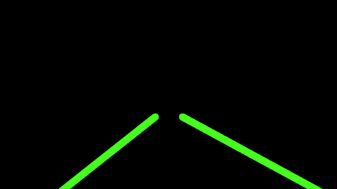

In [11]:
# Define helper function to draw the lines detected by the Hough Transform
# These functions can be used as is, however, modify/update the code as you may require. Some examples could include adaptive line length, curved lines, etc.


# helper function - fit a line to the Hough tranform coordinates, and plot on the image
def drawLine(img, x, y, color=[0, 255, 0], thickness=20):
    if len(x) == 0: 
        return
    
    lineParameters = np.polyfit(x, y, 1) 
    
    m = lineParameters[0]
    b = lineParameters[1]
    
    maxY = img.shape[0]
    maxX = img.shape[1]
    y1 = maxY
    x1 = int((y1 - b)/m)
    y2 = int((maxY/2)) + 60  # note: hardcoded, sets the length of the line to half the image height + 60 pixels
    x2 = int((y2 - b)/m)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)


# Helper function - split the detected lines into left and right lines
def draw_lines(img, lines, color=[0, 255, 0], thickness=20):

    leftPointsX = []
    leftPointsY = []
    rightPointsX = []
    rightPointsY = []

    for line in lines:
        for x1,y1,x2,y2 in line:
            m = (y1 - y2)/(x1 - x2)
            
                        
            if m < 0:
                leftPointsX.append(x1)
                leftPointsY.append(y1)
                leftPointsX.append(x2)
                leftPointsY.append(y2)
            else:
                rightPointsX.append(x1)
                rightPointsY.append(y1)
                rightPointsX.append(x2)
                rightPointsY.append(y2)

    drawLine(img, leftPointsX, leftPointsY, color, thickness)
        
    drawLine(img, rightPointsX, rightPointsY, color, thickness)



In [ ]:
# define a function - calculate Hough lines based on the Canny images, and draw them on the output image

# use the opencv cv2.HoughLinesP to calculate the Hough lines in the image (i.e. to detect the lanes)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, min_line_len, max_line_gap) 
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

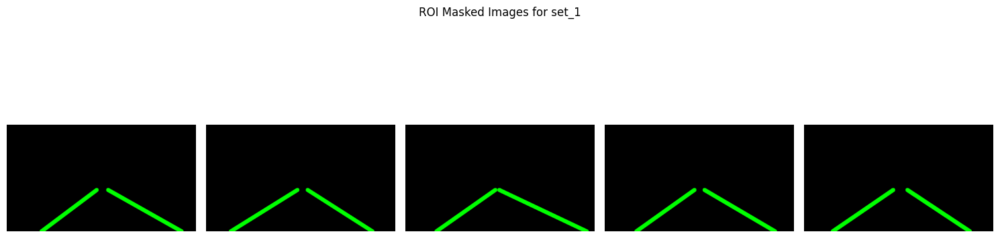

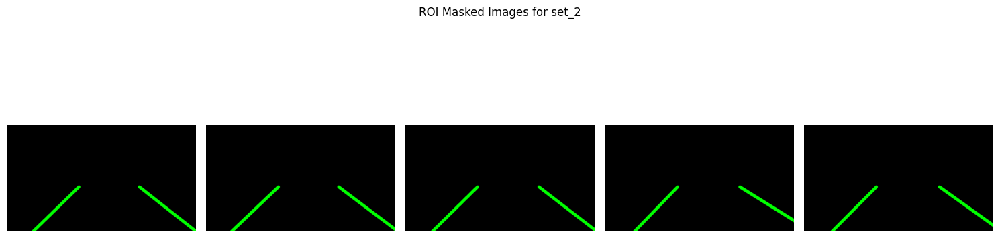

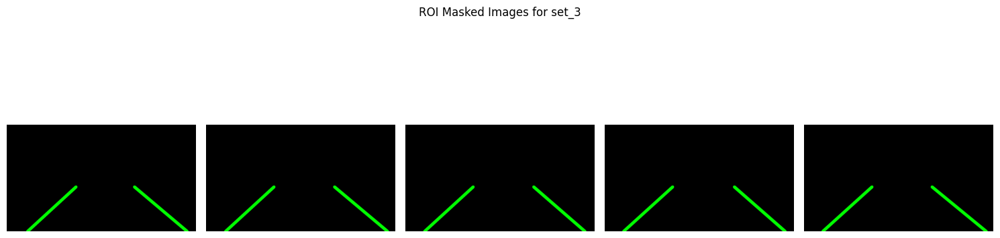

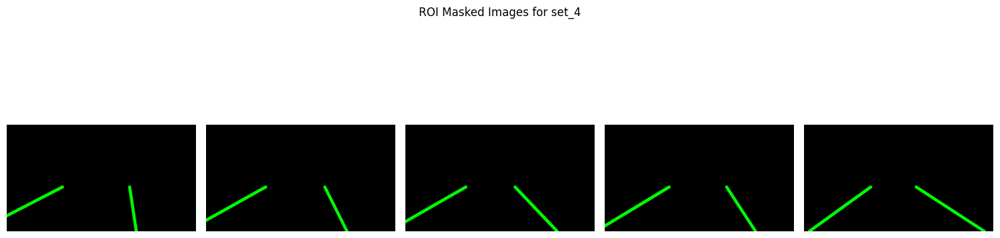

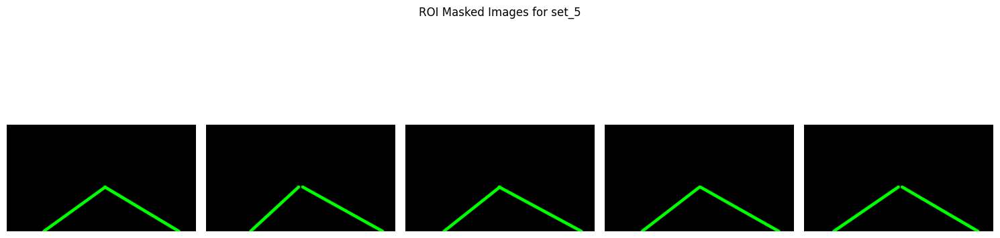

In [13]:
# define the parameters for the Hough line detector. The default values work reasonably well
hough_images_set = {}
rho = 1.60 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 10   # minimum number of votes (intersections in Hough grid cell)
min_line_length = 15 # minimum number of pixels making up a line
max_line_gap = 11   # maximum gap in pixels between connectable line segments

for set_name, images in masked_images_by_set.items():
    hough_image = [hough_lines(img, rho, theta, threshold, min_line_length, max_line_gap) for img in images]
    hough_images_set[set_name] = hough_image



for set_name, hough_images in hough_images_set.items():
    fig, axs = plt.subplots(1, len(hough_images), figsize=(15, 5))
    fig.suptitle(f"ROI Masked Images for {set_name}")
    for i, hough_image in enumerate(hough_images):
        axs[i].imshow(hough_image, cmap='gray')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

## Plot the Hough Lines on the original images
Now that we have detected the lines, we will overlay them on the original images.

Bringing it all together:

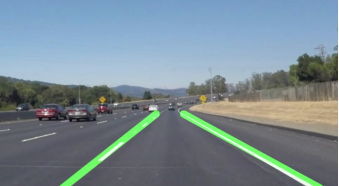

Note: In your *submitted* Jupyter Notebook, in this section you should include graphs of all images in the 5 test sets, with the "overlay" of the detected lane markings on the original image (up to 25 images). 
For the intermediate stages of processing, it is sufficient to include plots of two test images, one "easy" and one "hard" in your submitted notebook. However, during development of your code, you will of course need to test all 25 test images to make sure your algorithm is working correctly.  

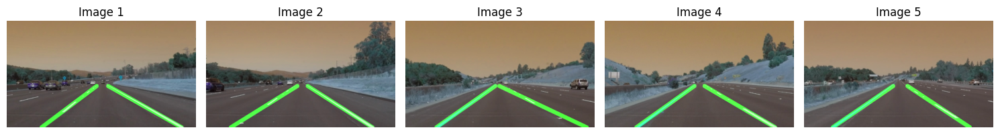

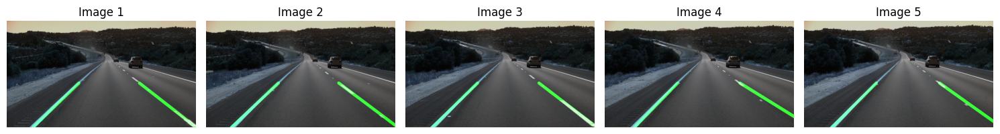

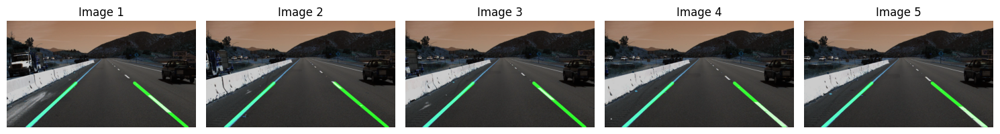

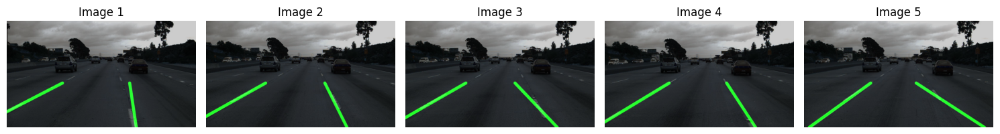

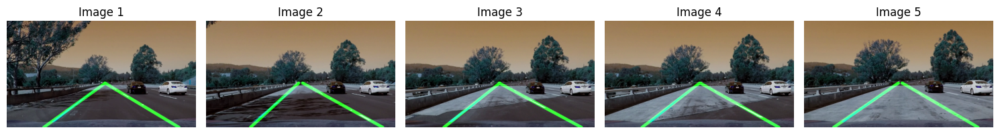

In [22]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images_set = {}

for set_name, images in images_by_set.items():
    blended_images = []
    
    for i in range(len(images)):
        original_image = images_by_set[set_name][i]
        hough_image = hough_images_set[set_name][i]  
        
        # Ensure the images are the same size
        if original_image.shape == hough_image.shape:
            blended_image = cv2.addWeighted(original_image, α, hough_image, β, λ)
            blended_images.append(blended_image)
    # Store the list of blended images for this set
    final_images_set[set_name] = blended_images

for set_name, blended_images in final_images_set.items():
    fig, axs = plt.subplots(1, len(blended_images), figsize=(15, 5))
    
    for i, blended_image in enumerate(blended_images):
        axs[i].imshow(blended_image)
        axs[i].axis('off')
        axs[i].set_title(f"Image {i + 1}")
    
    plt.tight_layout()
    plt.show()

## Summary of findings, and other remarks

Comment on the performance of the line detector: 
- In what scenarios (i.e. test sets) does it work well?
- In what scenarios (i.e. test sets) does it not work? 
- Comment on why this implementation does not work in some scenarios
- Set 5 images are more challenging due to road surface and contrast changes. You may need to make your aproach more "sophisticated" to account for this.
- Vary the threshold parameters of the Canny edge detector, and comment on the impact on the lane detection performance
- Vary the parameters used by the cv2.HoughLinesP function (rho, theta, threshold etc), and comment on the impact on the lane detection performance
- Suggest methods to improve the performance of this lane detector. Specifically, consider how you would make the detector more robust against changes in contrast, lighting etc

- For the first three tests class the algorithm worked well they mainly required you to adjust the cropping to get them to work effectively and slightly adjust Gaussian blur if required.
- I adjusted the canny edge thresholds and it worked well I didn't need to adjust the canny thresholds for set 1, 2 or 3 but for set 4 I brought the upper threshold down to 85 as the general inntensity of the image is lower then the other 3 sets before it. The upper threshold being reduced helps the less intense edges to be definitely counted as an edge which what was required to succesfully detect the edges in this image. The first three sets the edges were very obvious so the upper threshold didn't need to be reduced and I ended up increasing the upper threshold and lowering the lower threshold by 10. For set 5 the  I kept the canny thresholds as they were as the bitmasks made the edges for the road markings very defined so they didn't need to be changed.
- The main issue with set 4 was the lumination of the image was very low so the contrast of the road marking were trickier to detect then the previous three sets. This requuired changing the parameters of the canny edge detector kernel and changing the Gaussian blur kernel also. It was relatively easy to get it to work by adjusting the Hough transform parameters but sense I wanted all sets to use the same Hough parameters it became more tricky as it involved generalising these parameters for all 4 sets adjusting blur kernels and cannly edge thresholds only. 
- max gap in pixels for line segments was good up until a certain point where you reached the possibility of segments joining from other sides of the road. This point was different for each sets as the road widths were differnt so it was balancing it that all the lines were able to connect but none of the images would start reading lines across the road I found making the blur kernels blur more in the horizontal direction helped with this also as the canny would often make the horizontal lines on the road very vivid and the hough transform would connect them. 
- I then adjusted the rho value, for the first three sets I reduced this value to 0.5 initially and it reacted very well as there was very little noise so the smaller distance resolution worked very well to keep the Hough markings very precise.
- When I was doing set 4 and 5 this value had to be increased to above 1 and I ended up with 1.65. It took a bit of iteration to get the right value as the Hough transform seemed to be very sensitive to this parameter. If there was any noise on the image for the lower distance resolution it would effect the Hough transform so I increased this value to be less suscptible to the noise and to be able to connect lines segments with a larger gap. 
- I did adjust the threshold value and min line length value but found that they didn't have a big impact on the image or the outcome I was looking for in the image so didn't chamge these values too much. Some of the images were being effected by noise so I tried to increase these values in order to get rid of the noise but sense some of the lines were so small I ended up returning them to their original values and just adjusting the Gaussian blur and sobel kernels to try and adjust the nosie out of the image. 
- For set 5 the initial implementation above didn't work very well and set 4 is very sensitive to this implementation. The implemetnation I used for set 5 is a good improvemnt reducing the nosie from the image and if you use the HSV and BGR colormaps it works very well. The fact that the two bitmasks use the bitwise OR operation also means that it doesn't matter whether the road markings are whte or yellow they will still be detected.
- The downfall of my current implementation is it doesn't respond to bends in the road well. I was trying to come up with a solution to this and you could use very small Roi's that track along the initial Hough line and track the curve but the line sigements would have to be very accurate. I was also researching about converting the image to a birds eye view using extrinsic and intrinsic matrices and it is easier to see the bends in the distance from this angle then calculate the bends in this view and the matrices allow you to translate this back into the original image. I didn't have time to properly implement this method but it sounds more robust then using small ROIs to trach the bend. 
rast of the road marking were trickier to detect then the previous three sets. This requuired changing the parameters of the canny edge detector kernel and changing the Gaussian blur kernel also. It was relatively easy to get it to work by adjusting the Hough transform parameters but sense I wanted all sets to use the same Hough parameters it became more tricky as it involved generalising these parameters for all 4 sets adjusting blur kernels and cannly edge thresholds only. 

## Summary of above
1. Initial adjustments (Sets 1-3):
- __Cropping and Gaussian Blur:__ Minor adjustments were made to crop and blur parameters to refine edge clarity.  
- __Canny Edge Thresholds:__ For sets 1-3 as edges were distinct, slightly increased the upper threshold and decreased the lower threshold by 10 to refine edge detection.   
- __Hough Transform:__ A low rho (0.5) worked well for these sets as noise was minimal, allowing for precise line detection. This waas later increased to get all 5 sets to work with the same Hough parameters
2. Set 4 Adjustments:
- __Lower Illumination:__ The image’s low brightness reduced contrast, making lane detection challenging.
- __Edge Detection:__ Reduced upper Canny threshold to 85 to capture lower-intensity edges.
- __Increase blur:__ Had to increase the gaussian blur standard deviation as it was getting effected by noise but tried not increase it too much to effect the actual laneway markings.
3. Set 5 Implementation:
- __Bitmask Approach:__ Using HSV and BGR color masks with bitwise OR allowed for robust detection of both white and yellow lane markings.
- __Edge Detection:__ The distinct road markings edges required no threshold adjustments due to the pre processing and didn't need that much of a blur. (The blur is done in the HSV code block).
- __Birds eye view:__ The only thing that my current implementation doesn't do well is read the curves further down the road. One implementation I was researching was transforming the image to a birds eye view and it will be easier to see the bends in the road at this view and then you can translate them into the original image using an extrinsic matrix.
4. Hough Transform parameters:
- __Max_gap_line_gap:__ This parameter neede to be increased for most sets especially 4 and 5 as the gaps between road markings were quite large. However had to be wary as if the value was too large line segements from other side of road would start to connect.
- __RHO:__ Reduced for the first three sets to 0.5 and worked very well as there was no noise so was very precise but had to increase it to 1.65 for the 4th and 5th set to be able to recognise bigger gaps in line segemnts and the bigger kernel size would have less effect on noise.
- __theta:__ This value didn't have a big effect on trying to get the Hough transform to read bends. I didn't find it effective.
- __min_line_length:__ Kept it around the same value tried to increase it when noise was being effected inn the image but changing blur kernel or canny thresholds was more effective.
- __Thresholds:__ Didn't change this value either too much I found changing the blur kernel or Canny threshold was more efffective for what I was trying to accomplish. 

## Research on set 5
I used the below codeblocks to try get working implementation for set 5 and then placed it into the above dictionary with all of the other sets.

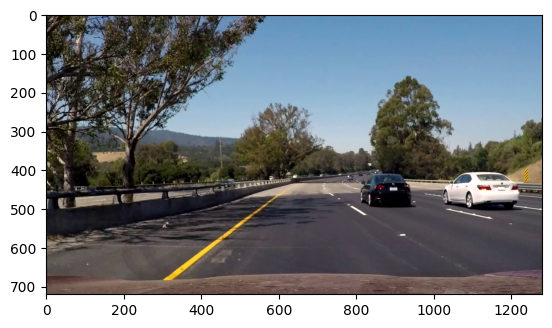

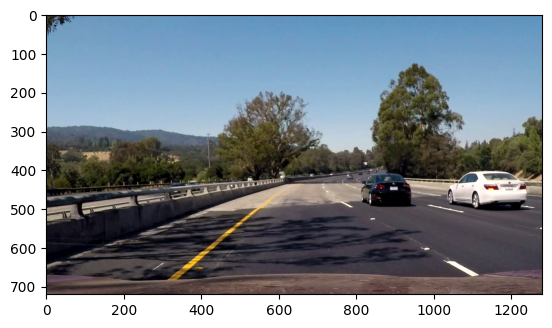

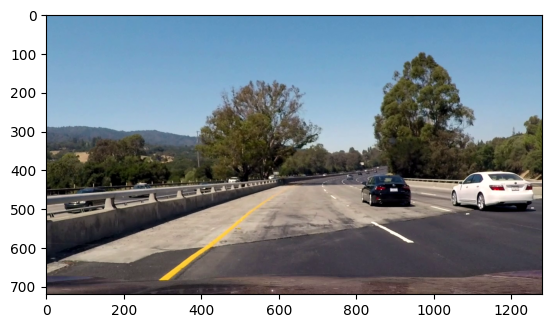

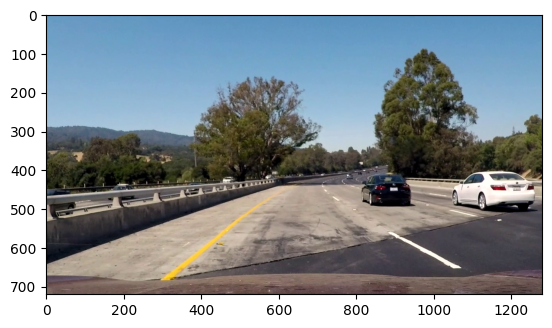

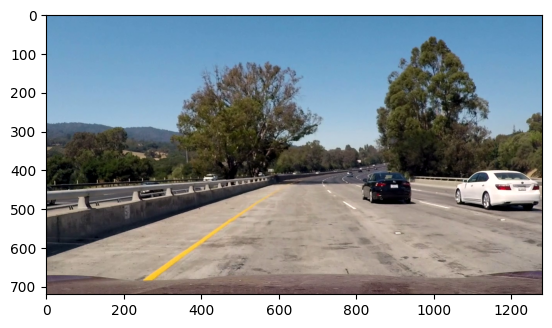

In [15]:
input_path = 'images/set_5/'
filenames = [input_path + filename for filename in os.listdir(input_path)]
raw_images = [cv2.imread(filename) for filename in filenames]
count = len(raw_images)
for i in range(count):
    plt.imshow(cv2.cvtColor(raw_images[i], cv2.COLOR_BGR2RGB))
    plt.show()

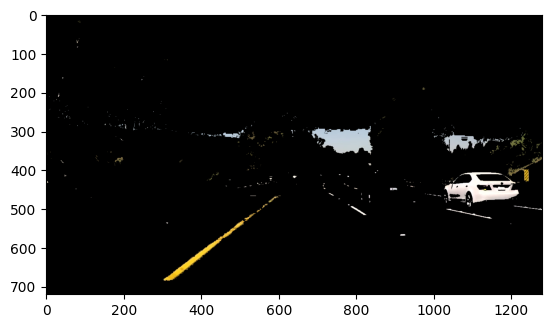

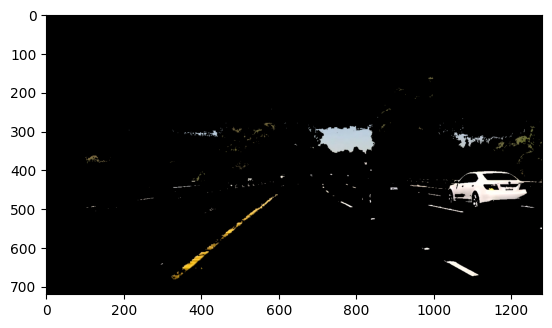

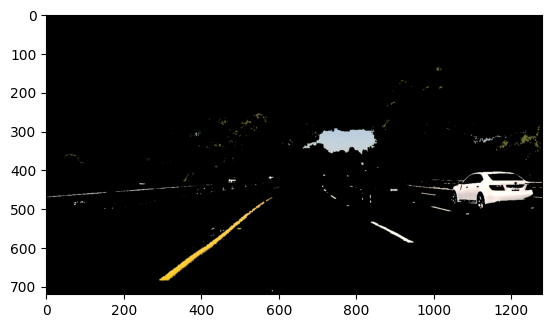

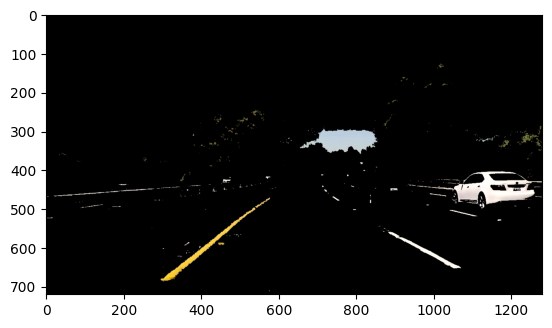

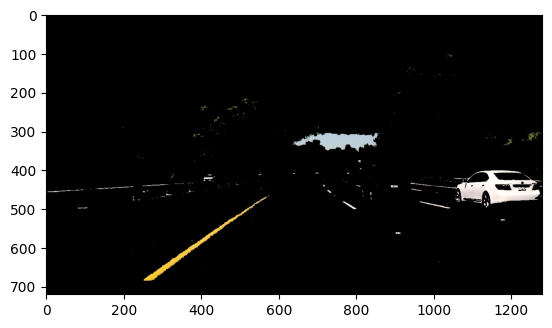

In [23]:
masked_images = []

for image in raw_images:
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_threshold_white = np.uint8([185, 185, 185])
    upper_threshold_white = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_threshold_white, upper_threshold_white)

    lower_threshold_yellow = np.array([20, 100, 100])  
    upper_threshold_yellow = np.array([40, 255, 255]) 

    # Create a mask for yellow areas
    yellow_mask = cv2.inRange(hsv_image, lower_threshold_yellow, upper_threshold_yellow)

    # Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)

    # Apply the mask to the image using and operation to keep only white and yellow area
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    masked_images.append(masked_image)
  
    plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
    plt.show()


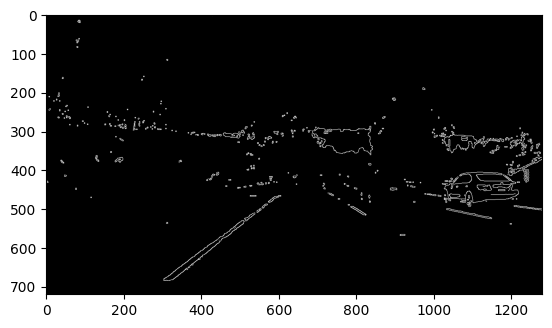

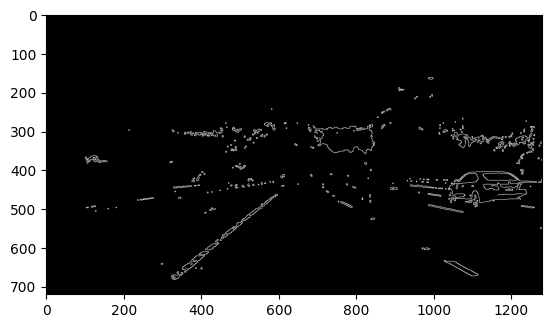

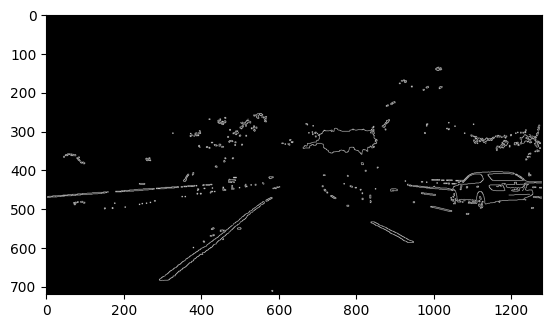

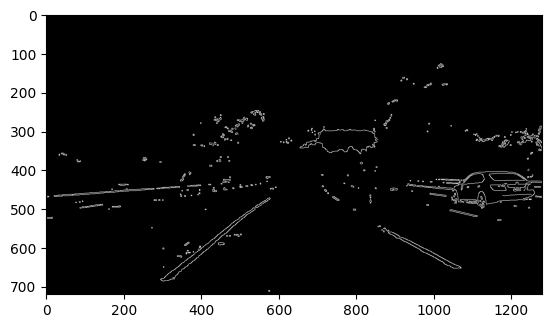

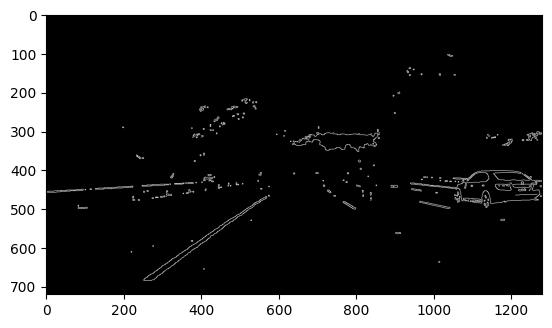

In [24]:
sobel_images = []

for image in masked_images:
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define a kernel size and apply Gaussian smoothing
    kernel_size = 5
    blur_gray = cv2.GaussianBlur(gray_image, (kernel_size, kernel_size), 0)

    # Define our parameters for Canny and apply
    low_threshold = 30
    high_threshold = 100
    edges = cv2.Canny(blur_gray, low_threshold, high_threshold)
    sobel_images.append(edges)
    # Display the image
    plt.imshow(edges, cmap='Greys_r')
    plt.show()

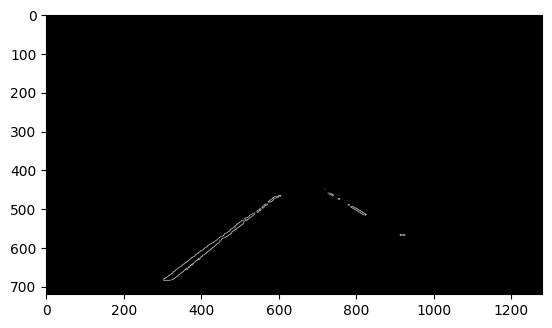

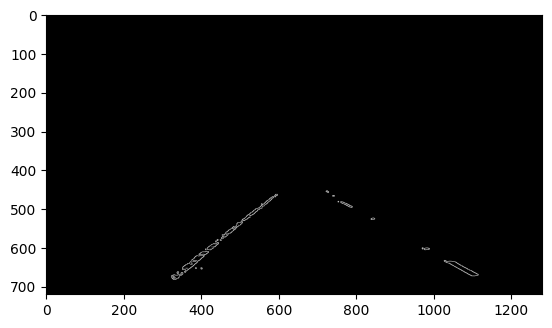

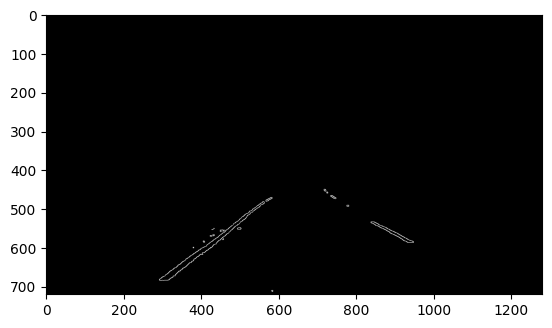

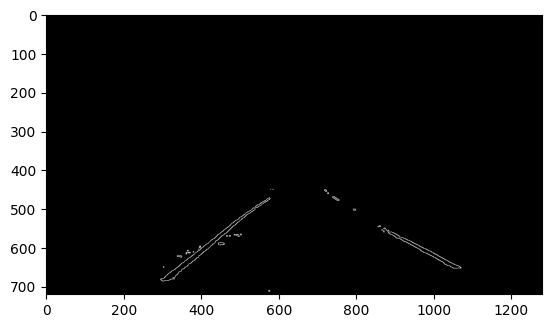

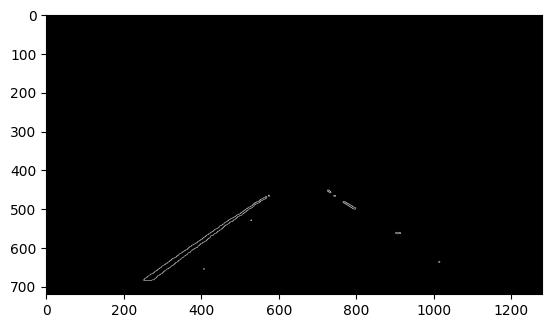

In [25]:
rois = []
for images in sobel_images:
    region = np.array([[(570, 450), (xsize - 520, 450), (1200, ysize), (200, ysize)]], dtype=np.int32)
    regionOfInterest = region_of_interest(images, region) 
    rois.append(regionOfInterest) 
    plt.imshow(regionOfInterest, cmap='Greys_r')
    plt.show()

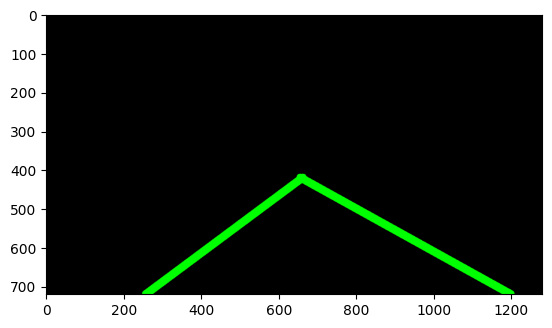

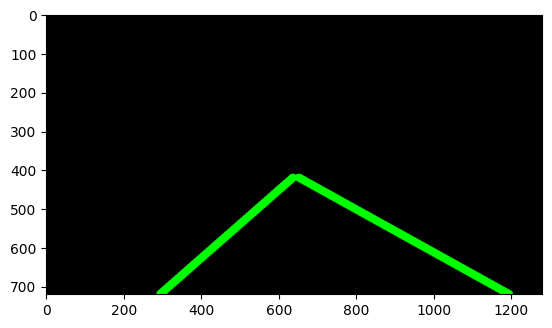

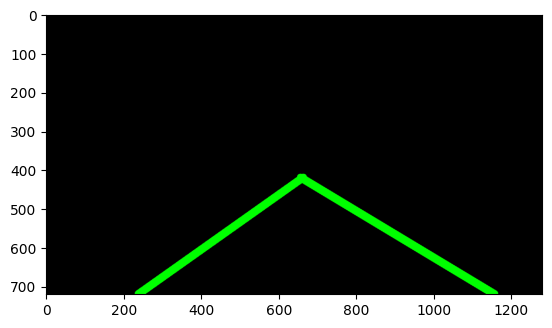

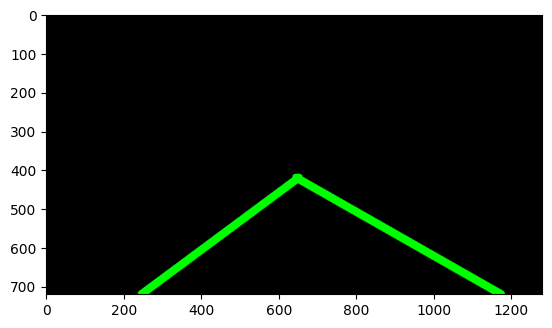

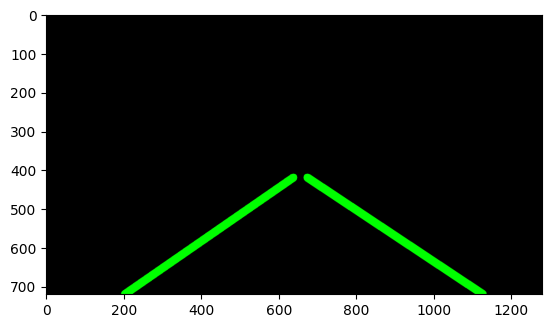

In [26]:
# define the parameters for the Hough line detector. The default values work reasonably well
hough_images = []
rho = 1.4 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 10   # minimum number of votes (intersections in Hough grid cell)
min_line_length = 20 # minimum number of pixels making up a line
max_line_gap = 10   # maximum gap in pixels between connectable line segments

for image in rois:
    hough_image = hough_lines(image, rho, theta, threshold, min_line_length, max_line_gap)
    hough_images.append(hough_image)
    plt.imshow(hough_image)
    plt.show()



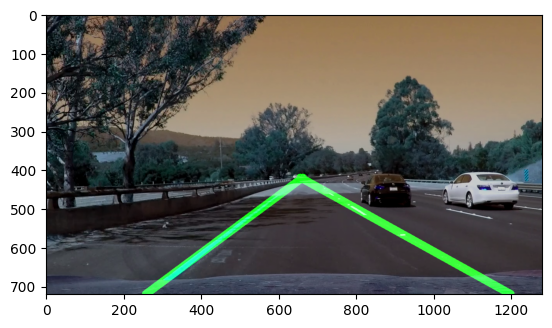

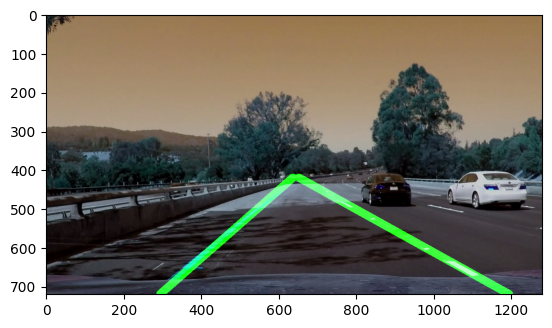

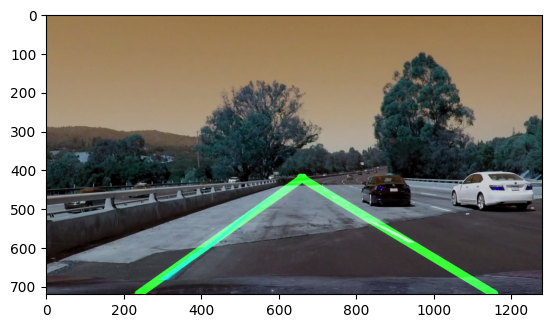

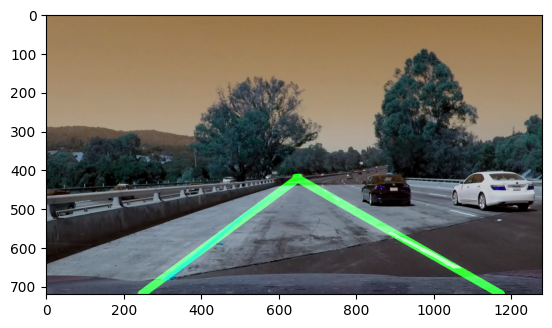

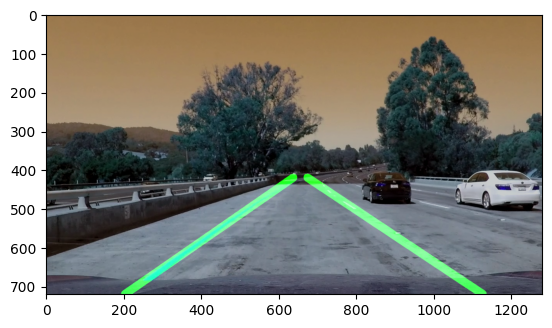

In [27]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images = list()

# iterate through teh hough images and put hough lines onto the original image
for i in range(len(hough_images)):
    original_image = raw_images[i]
    hough_image = hough_images[i]  # Make sure this exists and is of the same size
    
    # Ensure theimages are the same size
    if original_image.shape == hough_image.shape:
        blended_image = cv2.addWeighted(original_image, α, hough_image, β, λ)
        blended_images.append(blended_image)
    
    final_images.append(blended_image)
    # Display the final result (one of the merged images, for example the first one)
    plt.imshow( blended_image)
    plt.show()

       
    